# Segmentation and Tracking for Control and Experimental Series

This notebook builds a PyDIP-based segmentation and tracking pipeline for the Control Series and the Experimental Series.

- **Segmentation procedure:** smoothing + Otsu thresholding + morphological opening/closing + hole filling + area opening + border-object removal + seeded watershed.
- **Selection:** choose the 15 largest segmented objects in the initial frame to serve as the tracked cells.
- **Tracking criterion:** a cell in the next frame is matched to the current frame by minimal centroid displacement, with size consistency as a secondary check.
- **Validation:** manually inspect the traces of 5 selected cells and visualize their trajectories to confirm the algorithm is tracking the correct objects.


In [1]:
!pip install tifffile

In [2]:
from pathlib import Path
import numpy as np
import tifffile as tiff
import diplib as dip
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

IMG_DIR = Path("")   # <-- UPDATE THIS PATH
OUT_DIR = IMG_DIR / "output"
OUT_DIR.mkdir(exist_ok=True)

DIPlib -- a quantitative image analysis library
Version 3.6.0 (Oct 23 2025)
For more information see https://diplib.org


SEGMENTATION PROCEDURE
1. Convert to float and apply Gaussian smoothing (sigma=1.0) to suppress pixel noise before thresholding.
2. Threshold at the 88th intensity percentile.Motivation: Otsu thresholding fails here because ~88% of pixels are dark background; it picks a threshold in the low 20s which captures dim cytoplasm and bridges touching cells. The 88th percentile (~40-50 intensity units) isolates only the bright nucleus cores, which are naturally separated even when cells are touching.
3. FillHoles to remove internal holes from thresholded nuclei.
4. BinaryAreaOpening (100 px) to remove small noise fragments.
5. Remove border-touching objects (incomplete cells at edges).
6. Euclidean distance transform to model cell interior depth.
7. Smooth distance map (sigma=1.5) before finding maxima to suppress spurious local peaks caused by jagged boundaries, ensuring one seed per nucleus.
8. SeededWatershed on the original distance map constrained to the binary mask - separates touching nuclei at their contact.
9. Shape-based filtering: reject objects outside the 20-80th size percentile, with roundness < 0.65 or aspect ratio > 2.0, to exclude debris and any remaining merged pairs.
10. Select the 15 largest remaining valid objects as tracked cells.

Emilija's code in function form!

In [3]:
def print_intensity_percentiles(arr, percentiles=(50, 70, 80, 85, 90, 95)):
    """Print intensity percentiles of a 2-D image array.
    """
    flat = arr.flatten().astype(np.float32)
    for p in percentiles:
        print(f"  {p}th percentile intensity: {np.percentile(flat, p):.1f}")


def segment_frame(arr, percentile=88, smooth_sigma=1.0, min_area=100):
    """Segment nuclei in a single fluorescence microscopy frame.

    Pipeline:
      1. Convert to float and Gaussian-smooth (sigma=``smooth_sigma``) to
         suppress pixel noise.
      2. Threshold at the given intensity percentile.  Otsu fails here because
         ~88 % of pixels are dark background; a high-percentile threshold
         isolates only the bright nucleus cores.
      3. Fill holes, remove small fragments (BinaryAreaOpening).
      4. Remove objects that touch the image border (incomplete cells).
      5. Euclidean distance transform + smoothed-maxima seeds.
      6. Seeded watershed separates touching nuclei.
    """
    frame_img = dip.Image(arr)
    if frame_img.TensorElements() > 1:
        frame_img = dip.RGBToGray(frame_img)
    frame_img = dip.Convert(frame_img, 'SFLOAT')

    smooth = dip.Gauss(frame_img, sigmas=[smooth_sigma])
    threshold = float(np.percentile(np.asarray(smooth), percentile))
    binary = smooth > threshold

    binary = dip.FillHoles(binary)
    binary = dip.BinaryAreaOpening(binary, filterSize=min_area)

    # Remove objects touching the image border (incomplete cells)
    border_labels = dip.Label(binary, connectivity=1)
    border_arr = np.asarray(border_labels)
    border_ids = np.unique(np.concatenate([
        border_arr[0, :], border_arr[-1, :],
        border_arr[:, 0], border_arr[:, -1]
    ])).tolist()
    for bid in border_ids:
        if bid > 0:
            binary[border_labels == int(bid)] = False

    # Seeded watershed separates touching nuclei at their narrowest contact
    dist = dip.EuclideanDistanceTransform(binary)
    dist_smooth = dip.Gauss(dist, sigmas=[1.5])
    seeds = dip.Label(dip.Maxima(dist_smooth))
    labels_full = dip.SeededWatershed(dist, seeds, binary, connectivity=1, flags={'labels'})

    return binary, labels_full, np.asarray(labels_full), threshold


def measure_objects(labels_full):
    """Measure size, centroid, roundness, and aspect ratio for every labelled object.
    """
    stats = dip.MeasurementTool.Measure(
        labels_full, features=['Size', 'Center', 'Roundness', 'AspectRatioFeret']
    )
    sizes, centers, roundness, aspect = {}, {}, {}, {}
    for lid in stats['Size'].keys():
        if lid > 0:
            sizes[lid]     = float(stats['Size'][lid][0])
            centers[lid]   = np.array([float(stats['Center'][lid][1]),
                                        float(stats['Center'][lid][0])])
            roundness[lid] = float(stats['Roundness'][lid][0])
            aspect[lid]    = float(stats['AspectRatioFeret'][lid][0])
    return sizes, centers, roundness, aspect


def filter_objects(sizes, roundness, aspect,
                   size_pct_lo=20, size_pct_hi=80,
                   min_roundness=0.65, max_aspect=2.0):
    """Return label IDs that pass shape-based quality filters.

    Objects are rejected if their area falls outside
    [``size_pct_lo``th percentile x 0.5, ``size_pct_hi``th percentile x 2.5],
    their roundness is below ``min_roundness``, or their Feret aspect ratio
    exceeds ``max_aspect``.  This removes debris and merged cell pairs.
    """
    all_sizes = np.array(list(sizes.values()))
    size_lo = np.percentile(all_sizes, size_pct_lo) * 0.5
    size_hi = np.percentile(all_sizes, size_pct_hi) * 2.5
    return [
        k for k in sizes
        if size_lo < sizes[k] < size_hi
        and roundness[k] > min_roundness
        and aspect[k] < max_aspect
    ]


def select_top_n(valid_ids, sizes, n=15):
    """Select the *n* largest objects from a list of valid label IDs.
    """
    return sorted(valid_ids, key=lambda k: sizes[k], reverse=True)[:n]


def build_selected_label_array(labels_arr, top_ids):
    """Create a label array where the selected objects are re-numbered 1..N.
    All pixels not belonging to the selected objects are set to 0.
    """
    selected = np.zeros_like(labels_arr, dtype=np.uint32)
    for new_id, old_id in enumerate(top_ids, start=1):
        selected[labels_arr == old_id] = new_id
    return selected


def normalize_u8(a):
    """Linearly scale an array to the 0-255 uint8 range.
    Returns a np.ndarray of dtype uint8
    """
    a = a.astype(np.float32)
    lo, hi = a.min(), a.max()
    if hi > lo:
        return ((a - lo) / (hi - lo) * 255).astype(np.uint8)
    return np.zeros_like(a, dtype=np.uint8)


def build_colored_overlay(arr, selected_arr, top_ids, centers, cmap_name='tab20'):
    """Blend cell-colour overlays onto a grayscale background image.

    Each selected cell is filled with a distinct colour (70 % weight) blended
    over the normalised grayscale original (30 % weight).
    Returns RGB overlay image and cmap    
    """
    cmap = plt.get_cmap(cmap_name)
    base = normalize_u8(arr)
    rgb = np.stack([base, base, base], axis=-1).astype(np.float32) / 255.0
    overlay = rgb.copy()
    for new_id, old_id in enumerate(top_ids, start=1):
        mask = selected_arr == new_id
        color = np.array(cmap((new_id - 1) % 20)[:3])
        overlay[mask] = overlay[mask] * 0.3 + color * 0.7
    return overlay, cmap


def plot_segmentation_summary(arr0, binary, overlay, threshold, centers,
                               top_ids, out_path):
    """Save a 3-panel figure: original | binary mask | labelled overlay."""
    binary_arr = np.asarray(binary).astype(np.uint8) * 255

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(arr0, cmap='gray')
    axes[0].set_title('Original frame 0', fontsize=12)
    axes[0].axis('off')

    axes[1].imshow(binary_arr, cmap='gray')
    axes[1].set_title(
        f'Binary mask (88th percentile threshold = {threshold:.0f})', fontsize=12)
    axes[1].axis('off')

    axes[2].imshow(overlay)
    for new_id, old_id in enumerate(top_ids, start=1):
        c = centers[old_id]
        axes[2].text(c[1], c[0], str(new_id), color='white', fontsize=9,
                     fontweight='bold', ha='center', va='center',
                     bbox=dict(boxstyle='round,pad=0.1', facecolor='black',
                               alpha=0.5, linewidth=0))
    axes[2].set_title('15 selected labeled cells (labels 1-15)', fontsize=12)
    axes[2].axis('off')

    plt.suptitle('Task 1: Segmentation Procedure - Control Series Frame 0', fontsize=13)
    plt.tight_layout()
    plt.savefig(str(out_path), dpi=150, bbox_inches='tight')
    plt.close()


def plot_labeled_overlay(overlay, cmap, centers, top_ids, out_path):
    """Save a standalone labelled-overlay figure with a cell-ID legend.
    """
    fig, ax = plt.subplots(figsize=(9, 9))
    ax.imshow(overlay, interpolation='nearest')
    ax.axis('off')
    ax.set_title('Control Series - Frame 0\n15 Selected and Labeled Cells',
                 fontsize=13, pad=10)

    for new_id, old_id in enumerate(top_ids, start=1):
        c = centers[old_id]
        ax.text(c[1], c[0], str(new_id), color='white', fontsize=11,
                fontweight='bold', ha='center', va='center',
                bbox=dict(boxstyle='round,pad=0.15', facecolor='black',
                          alpha=0.55, linewidth=0))

    patches = [mpatches.Patch(color=cmap(i % 20), label=f'Cell {i+1}')
               for i in range(len(top_ids))]
    ax.legend(handles=patches, loc='upper right', fontsize=7, ncol=2,
              framealpha=0.8, title='Cell ID')
    plt.tight_layout()
    plt.savefig(str(out_path), dpi=150, bbox_inches='tight')
    plt.close()


def plot_all_labels(labels_arr, out_path):
    """Save a figure showing every segmented object in a distinct random colour.
    Adjacent-cell visual separation is improved by shuffling the colormap
    assignment so numerically close label IDs get different hues.
  """
    unique_ids = np.unique(labels_arr[labels_arr > 0])

    shuffled = unique_ids.copy()
    np.random.seed(42)
    np.random.shuffle(shuffled)
    label_display = np.zeros_like(labels_arr, dtype=np.float32)
    for orig, shuf in zip(unique_ids, shuffled):
        label_display[labels_arr == orig] = shuf

    label_norm = label_display / label_display.max()
    colored = plt.get_cmap('nipy_spectral')(label_norm)
    colored[labels_arr == 0] = [0, 0, 0, 1]

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(colored, interpolation='nearest')
    ax.set_title(f'All segmented objects - Frame 0  (n = {len(unique_ids)})', fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(str(out_path), dpi=150, bbox_inches='tight')
    plt.close()

    return unique_ids

In [4]:

arr0 = tiff.imread(str(IMG_DIR / "MTLn3-ctrl0000.tif"))
print_intensity_percentiles(arr0)

#SEGEMNT, MEASURE, FILTER, SELECT
binary, labels_full, labels_arr, threshold = segment_frame(arr0)
sizes, centers, roundness, aspect = measure_objects(labels_full)
valid_ids = filter_objects(sizes, roundness, aspect)
top15_ids = select_top_n(valid_ids, sizes, n=15)

# Build relabelled array 
selected_arr = build_selected_label_array(labels_arr, top15_ids)
dip.ImageWrite(dip.Image(selected_arr), str(OUT_DIR / "control_frame0_labels.tif"))

# Save full watershed label TIFF 
dip.ImageWrite(labels_full, str(OUT_DIR / "control_frame0_full_labels.tif"))

# Build coloured overlay and save all figures 
overlay, cmap = build_colored_overlay(arr0, selected_arr, top15_ids, centers)
plot_segmentation_summary(arr0, binary, overlay, threshold, centers, top15_ids,
                          OUT_DIR / "task1_summary.png")
plot_labeled_overlay(overlay, cmap, centers, top15_ids,
                     OUT_DIR / "task1_labeled_overlay.png")
unique_ids = plot_all_labels(labels_arr, OUT_DIR / "task1_full_labels.png")

print("Task 1 complete.")
print(f"Threshold used: {threshold:.1f}")
print(f"Total segmented objects: {len(unique_ids)}")
print(f"Selected cell IDs (original): {top15_ids}")
print("Saved: control_frame0_labels.tif, control_frame0_full_labels.tif")
print("       task1_summary.png, task1_labeled_overlay.png, task1_full_labels.png")

  50th percentile intensity: 19.0
  70th percentile intensity: 23.0
  80th percentile intensity: 29.0
  85th percentile intensity: 36.0
  90th percentile intensity: 47.0
  95th percentile intensity: 64.0
Task 1 complete.
Threshold used: 42.5
Total segmented objects: 76
Selected cell IDs (original): [19, 57, 61, 5, 51, 26, 77, 60, 69, 10, 78, 23, 11, 62, 4]
Saved: control_frame0_labels.tif, control_frame0_full_labels.tif
       task1_summary.png, task1_labeled_overlay.png, task1_full_labels.png


## Task 2 — Tracking with a Loss Function (The loss approach)

For each tracked cell in frame `t`, the successor in frame `t+1` is the candidate object that minimises a weighted **loss**:

$$ L(i, j) = w_d \cdot min(\| c_i - c_j \|,(d_{\max})) + w_s \cdot \frac{|s_i - s_j|}{s_i} + w_r \cdot | r_i - r_j | $$

- `c` = centroid, `s` = area, `r` = roundness (all already measured by `measure_objects`).
- A hard gate `d_max` (max displacement in pixels) discards impossibly far candidates.
- Each candidate in frame `t+1` may be assigned to at most one tracked cell (greedy, smallest-loss first), so two tracks can't collapse onto the same object.
- Measurements for every successor are appended to `tracks[cell_id]`, giving a per-cell list of dicts (`frame, orig_label, center, size, roundness, aspect, loss`). Frames where the cell is lost record `None`.

The trace plot overlays each cell's centroid path on frame 0 (circle = start, square = end).

In [ ]:


def match_loss(prev, cand_center, cand_size, cand_roundness,
               max_disp=60.0, w_dist=1.0, w_size=0.4, w_round=0.3):
    """Compute the assignment cost between a tracked cell and a candidate object,  as described in the markdown field.
    """
    d = np.linalg.norm(prev['center'] - cand_center)
    if d > max_disp:
        # candidate is too far away to be the same cell
        return np.inf, d

    rel_size = abs(prev['size'] - cand_size) / max(prev['size'], 1.0)

    d_round = abs(prev['roundness'] - cand_roundness)

    loss = (w_dist  * (d / max_disp)
          + w_size  * rel_size
          + w_round * d_round)
    return loss, d



def track_cells(prefix, n_cells=15, max_disp=60.0,
                w_dist=1.0, w_size=0.4, w_round=0.3):
    """Track n_cells from frame 0 of a series using the multi-term loss.
    
    Algorithm
    Frame 0  : segment with segment_frame, measure with measure_objects,
               filter with filter_objects, pick top-N with select_top_n.
              
    Frame t>0: segment the new frame, score every (track, candidate) pair
               with match_loss, then assign greedily (smallest loss first).
               Each track and each candidate is used at most once, preventing
               two tracks from collapsing onto the same object.
               Unmatched tracks record None for that frame.

    """
    frame_paths = sorted(IMG_DIR.glob(f"{prefix}*.tif"))
    print(f"Found {len(frame_paths)} frames for prefix '{prefix}'")

    # Frame 0 segment and initialise one track record per selected cell 
    arr0 = tiff.imread(str(frame_paths[0]))
    _, labels_full0, _, _ = segment_frame(arr0)
    sizes0, centers0, rnd0, asp0 = measure_objects(labels_full0)
    valid0  = filter_objects(sizes0, rnd0, asp0)
    top_ids = select_top_n(valid0, sizes0, n=n_cells)

    tracks = {
        new_id: [{
            'frame':      0,
            'orig_label': old_id,
            'center':     centers0[old_id].copy(),
            'size':       sizes0[old_id],
            'roundness':  rnd0[old_id],
            'aspect':     asp0[old_id],
            'loss':       0.0,
            'disp':       0.0,
        }]
        for new_id, old_id in enumerate(top_ids, start=1)
    }
    prev_state = {nid: tracks[nid][0] for nid in tracks}

    #iterate over frames 
    for t, path in enumerate(frame_paths[1:], start=1):
        arr = tiff.imread(str(path))
        _, labels_full, _, _ = segment_frame(arr)
        sizes, centers, rnd, asp = measure_objects(labels_full)
        cand_ids = list(centers.keys())

        #build loss
        proposals = []
        for nid, prev in prev_state.items():
            if prev is None:
                continue
            for cid in cand_ids:
                loss, d = match_loss(
                    prev, centers[cid], sizes[cid], rnd[cid],
                    max_disp=max_disp,
                    w_dist=w_dist, w_size=w_size, w_round=w_round,
                )
                if np.isfinite(loss):
                    proposals.append((loss, d, nid, cid))
        proposals.sort()   #ascending: best (lowest-loss) matches come first

        # Greedy assignment: each track and each candidate used at most once
        assigned_track, used_cand = set(), set()
        for loss, d, nid, cid in proposals:
            #Issue with this apprach - candidates that are a good match for multiple tracks will be claimed by the first track that considers them, which may not be the best match.
            if nid in assigned_track or cid in used_cand:
                continue   # already claimed
            rec = {
                'frame':      t,
                'orig_label': cid,
                'center':     centers[cid].copy(),
                'size':       sizes[cid],
                'roundness':  rnd[cid],
                'aspect':     asp[cid],
                'loss':       loss,
                'disp':       d,
            }
            tracks[nid].append(rec)
            prev_state[nid] = rec
            assigned_track.add(nid)
            used_cand.add(cid)

        # Record None for every track with no valid candidate this frame
        for nid in tracks:
            if nid not in assigned_track:
                tracks[nid].append(None)
                prev_state[nid] = None

        print(f"  frame {t:02d}: matched {len(assigned_track)}/{n_cells}")

    return tracks, arr0



def plot_traces(tracks, arr0, out_path, title):
    """Overlay every cell centroid trajectory on frame 0.

    Circle = start (frame 0), square = end (last frame).
    """
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(arr0, cmap='gray')
    cmap_t = plt.get_cmap('tab20')

    for cell_id, recs in tracks.items():
        pts = np.array([r['center'] for r in recs if r is not None])
        if len(pts) < 2:
            continue
        color = cmap_t((cell_id - 1) % 20)
        ax.plot(pts[:, 1], pts[:, 0], '-',  color=color, lw=1.6, alpha=0.9)
        ax.plot(pts[0, 1],  pts[0, 0],  'o', color=color, ms=7, mec='white', mew=1.0)
        ax.plot(pts[-1, 1], pts[-1, 0], 's', color=color, ms=7, mec='white', mew=1.0)
        ax.text(pts[0, 1] + 4, pts[0, 0] + 4, str(cell_id),
                color='white', fontsize=9, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.15', facecolor='black',
                          alpha=0.55, linewidth=0))

    ax.set_title(title, fontsize=13)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(str(out_path), dpi=150, bbox_inches='tight')
    plt.close()


tracks_ctrl, arr0_ctrl = track_cells(prefix="MTLn3-ctrl")
plot_traces(tracks_ctrl, arr0_ctrl,
            OUT_DIR / "task2_traces_control.png",
            title="Control series - tracked cell trajectories (frames 0-29)")

tracks_egf, arr0_egf = track_cells(prefix="MTLn3+EGF")
plot_traces(tracks_egf, arr0_egf,
            OUT_DIR / "task2_traces_egf.png",
            title="EGF series - tracked cell trajectories (frames 0-29)")


def trace_summary(tracks, name):
    """Print path length and net displacement for every tracked cell."""
    print(f"\n{name}:")
    for cid, recs in tracks.items():
        valid = [r for r in recs if r is not None]
        if len(valid) < 2:
            print(f"  cell {cid:2d}: only {len(valid)} detection(s)")
            continue
        pts      = np.array([r['center'] for r in valid])
        path_len = np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1))
        net_disp = np.linalg.norm(pts[-1] - pts[0])
        print(f"  cell {cid:2d}: {len(valid)}/{len(recs)} frames  "
              f"path={path_len:7.1f} px  net={net_disp:6.1f} px")


trace_summary(tracks_ctrl, "Control")
trace_summary(tracks_egf,  "EGF")
print("\nSaved: task2_traces_control.png, task2_traces_egf.png")

Found 30 frames for prefix 'MTLn3-ctrl'
  frame 01: matched 15/15
  frame 02: matched 15/15
  frame 03: matched 15/15
  frame 04: matched 15/15
  frame 05: matched 15/15
  frame 06: matched 15/15
  frame 07: matched 15/15
  frame 08: matched 15/15
  frame 09: matched 15/15
  frame 10: matched 15/15
  frame 11: matched 14/15
  frame 12: matched 14/15
  frame 13: matched 14/15
  frame 14: matched 13/15
  frame 15: matched 13/15
  frame 16: matched 13/15
  frame 17: matched 13/15
  frame 18: matched 13/15
  frame 19: matched 13/15
  frame 20: matched 13/15
  frame 21: matched 13/15
  frame 22: matched 13/15
  frame 23: matched 13/15
  frame 24: matched 13/15
  frame 25: matched 13/15
  frame 26: matched 13/15
  frame 27: matched 13/15
  frame 28: matched 13/15
  frame 29: matched 13/15
Found 30 frames for prefix 'MTLn3+EGF'
  frame 01: matched 15/15
  frame 02: matched 15/15
  frame 03: matched 15/15
  frame 04: matched 15/15
  frame 05: matched 15/15
  frame 06: matched 15/15
  frame 07:

Generating GIFs.


Creating control series GIF ...
saved output\tracking_ctrl.gif  (30 frames @ 4 fps)

Creating EGF series GIF ...
saved output\tracking_egf.gif  (30 frames @ 4 fps)

Done.  Open output/tracking_ctrl.gif and output/tracking_egf.gif to verify tracking.


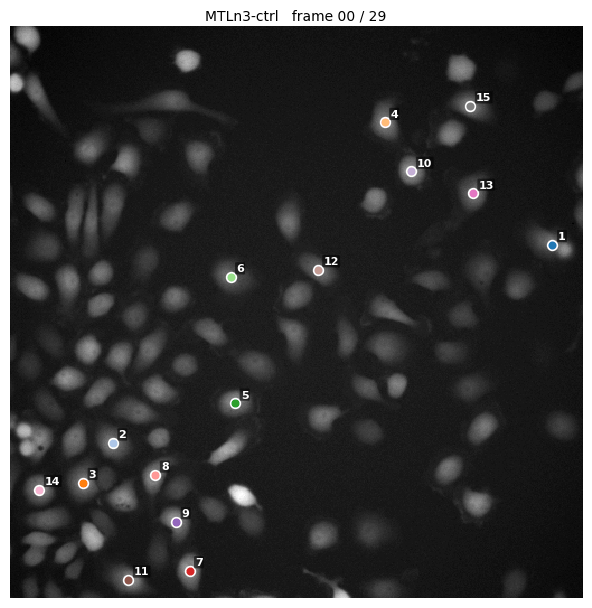

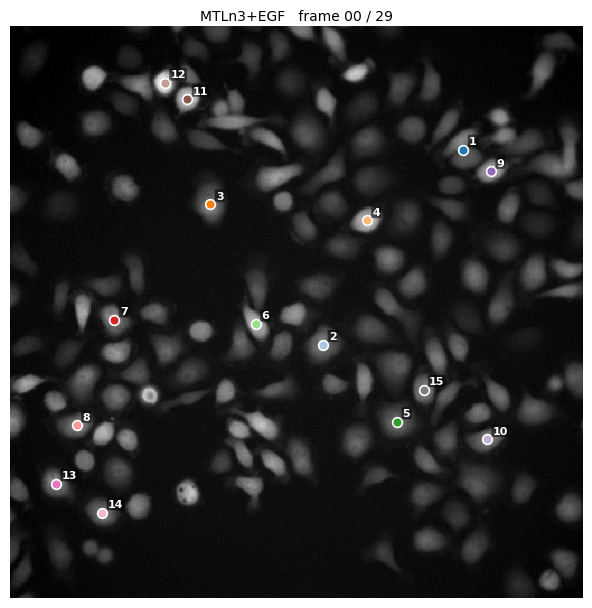

In [ ]:

import io
from PIL import Image


def make_tracking_gif(tracks, prefix, out_path, fps=4):
    """Save an animated GIF with each cell centre marked on every frame.

    For each frame t the raw image is displayed and the centroid of every
    tracked cell is drawn as a colour-coded dot labelled with its ID.


    """
    frame_paths = sorted(IMG_DIR.glob(f"{prefix}*.tif"))
    n_frames    = len(frame_paths)
    cmap_t      = plt.get_cmap('tab20')
    pil_frames  = []

    for t, path in enumerate(frame_paths):
        arr = tiff.imread(str(path))

        fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
        ax.imshow(arr, cmap='gray', interpolation='nearest')

        for cell_id, recs in tracks.items():
            if t >= len(recs) or recs[t] is None:
                continue                         # cell lost this frame we  skip
            c     = recs[t]['center']            
            color = cmap_t((cell_id - 1) % 20)
            # Centre marker
            ax.plot(c[1], c[0], 'o',
                    color=color, markersize=7, mec='white', mew=1.2,
                    zorder=3)
            # Cell ID label just above the dot
            ax.text(c[1] + 5, c[0] - 5, str(cell_id),
                    color='white', fontsize=8, fontweight='bold', zorder=4,
                    bbox=dict(boxstyle='round,pad=0.1', facecolor='black',
                              alpha=0.55, linewidth=0))

        ax.set_title(f"{prefix}   frame {t:02d} / {n_frames - 1}",
                     fontsize=10, pad=4)
        ax.axis('off')
        plt.tight_layout(pad=0.4)


        buf = io.BytesIO()
        fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')
        plt.close(fig)
        buf.seek(0)
        pil_frames.append(Image.open(buf).convert('RGB').copy())
        buf.close()


    #GIF SETTINGS
    # duration is the per-frame delay in milliseconds

    duration_ms = int(1000 / fps)
    pil_frames[0].save(
        str(out_path),
        save_all=True,
        append_images=pil_frames[1:],
        loop=0,           # 0 = loop forever
        duration=duration_ms,
        optimize=False,
    )
    print(f"saved {out_path}  ({len(pil_frames)} frames @ {fps} fps)")


print("Creating control series GIF ...")
make_tracking_gif(tracks_ctrl, "MTLn3-ctrl",
                  OUT_DIR / "tracking_ctrl.gif", fps=4)

print("\nCreating EGF series GIF ...")
make_tracking_gif(tracks_egf, "MTLn3+EGF",
                  OUT_DIR / "tracking_egf.gif", fps=4)

print("\nDone.  Open output/tracking_ctrl.gif and output/tracking_egf.gif to verify tracking.")

from IPython.display import Image, display
display(Image(filename=str(OUT_DIR / "tracking_ctrl.gif")))
display(Image(filename=str(OUT_DIR / "tracking_egf.gif")))

In [7]:
import pandas as pd
N_FRAMES = 30


def compute_texture_features(pixel_vals):
    """Mean, std, smoothness and uniformity for a mask's pixel values.

    smoothness  R = 1 - 1 / (1 + sigma_n^2)
                sigma_n = std of intensities normalised to [0,1] by (L-1)
    uniformity  U = sum(p_i^2) over a 256-bin normalised histogram
    """
    if len(pixel_vals) == 0:
        return dict(mean=np.nan, std=np.nan, smoothness=np.nan, uniformity=np.nan)

    vals = pixel_vals.astype(np.float64)
    L=256

    mu = float(np.mean(vals))
    sigma = float(np.std(vals))

    var_n = float(np.var(vals / (L - 1)))
    smoothness = float(1.0 - 1.0 / (1.0 + var_n))

    counts, _ = np.histogram(pixel_vals, bins=256, range=(0, L))
    p = counts / len(pixel_vals)
    uniformity = float(np.sum(p ** 2))

    return dict(mean=mu, std=sigma, smoothness=smoothness, uniformity=uniformity)



def compute_shape_texture(tracks_subset, prefix):
    """Re-segment every frame and compute shape + texture per tracked cell.

    Shape features come directly from dip.MeasurementTool so they match
    the exact watershed region.Texture features are computed from the
    raw (unsmoothed) pixel intensities inside that same region.

    """
    frame_paths = sorted(IMG_DIR.glob(f"{prefix}*.tif"))
    n_frames    = len(frame_paths)
    results     = {cid: [] for cid in tracks_subset}

    for t, path in enumerate(frame_paths):
        arr = tiff.imread(str(path))

        #segment_frame returns the dip label image and the numpy array
        _, labels_full, labels_arr, _ = segment_frame(arr)

        #Measure shape features
        stats = dip.MeasurementTool.Measure(
            labels_full,
            features=['Size', 'Perimeter', 'Roundness']
        )

        for cell_id, recs in tracks_subset.items():
            orig_label = recs[t]['orig_label']

            #Label must exist in this frame's segmentation
            if orig_label not in [k for k in stats['Size'].keys()]:
                continue

            #  Shape features from MeasurementTool 
            area      = float(stats['Size'][orig_label][0])       # px^2
            perimeter = float(stats['Perimeter'][orig_label][0])  # px
            roundness = float(stats['Roundness'][orig_label][0])  # [0,1]

            # Texture features from raw pixel values in mask 
            mask       = labels_arr == orig_label
            pixel_vals = arr[mask]
            tex        = compute_texture_features(pixel_vals)

            results[cell_id].append({
                'frame':      t,
                # shape
                'area':       area,
                'perimeter':  perimeter,
                'roundness':  roundness,
                # texture
                'mean':       tex['mean'],
                'std':        tex['std'],
                'smoothness': tex['smoothness'],
                'uniformity': tex['uniformity'],
            })

        if t % 5 == 0 or t == n_frames - 1:
            print(f"  frame {t:02d}/{n_frames - 1} done")

    return results



def build_shape_texture_table(results, series_name):
    """Average all features over 30 frames and print as a DataFrame."""
    rows = []
    for cell_id in sorted(results):
        ff = results[cell_id]
        if not ff:
            continue
        rows.append({
            'Cell ID':    cell_id,
            # shape
            'Area (px2)':   round(np.mean([f['area']       for f in ff]), 1),
            'Perim. (px)':  round(np.mean([f['perimeter']  for f in ff]), 1),
            'Roundness':    round(np.mean([f['roundness']   for f in ff]), 4),
            # texture
            'Mean':         round(np.mean([f['mean']        for f in ff]), 2),
            'Std Dev':      round(np.mean([f['std']         for f in ff]), 2),
            'Smoothness':   round(np.mean([f['smoothness']  for f in ff]), 6),
            'Uniformity':   round(np.mean([f['uniformity']  for f in ff]), 6),
            'Frames':       len(ff),
        })

    df = pd.DataFrame(rows).set_index('Cell ID')
    print(f"\n{'='*80}")
    print(f"  {series_name}  shape + texture  (mean over {N_FRAMES} frames, consistent cells)")
    print(f"{'='*80}")
    print(df.to_string())
    return df




consistent_ctrl_ids = [
    cid for cid, recs in tracks_ctrl.items()
    if len(recs) == N_FRAMES and all(r is not None for r in recs)
]
consistent_egf_ids = [
    cid for cid, recs in tracks_egf.items()
    if len(recs) == N_FRAMES and all(r is not None for r in recs)
]

print(f"Control  consistent cells: {len(consistent_ctrl_ids)} / {len(tracks_ctrl)}  IDs: {consistent_ctrl_ids}")
print(f"EGF      consistent cells: {len(consistent_egf_ids)} / {len(tracks_egf)}   IDs: {consistent_egf_ids}")

tracks_ctrl_consistent = {cid: tracks_ctrl[cid] for cid in consistent_ctrl_ids}
tracks_egf_consistent  = {cid: tracks_egf[cid]  for cid in consistent_egf_ids}

print("\nProcessing Control series ...")
results_ctrl = compute_shape_texture(tracks_ctrl_consistent, "MTLn3-ctrl")
df_ctrl = build_shape_texture_table(results_ctrl, "Control series")

print("\nProcessing EGF series ...")
results_egf = compute_shape_texture(tracks_egf_consistent, "MTLn3+EGF")
df_egf = build_shape_texture_table(results_egf, "EGF series")

Control  consistent cells: 13 / 15  IDs: [2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15]
EGF      consistent cells: 13 / 15   IDs: [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 13, 14, 15]

Processing Control series ...
  frame 00/29 done
  frame 05/29 done
  frame 10/29 done
  frame 15/29 done
  frame 20/29 done
  frame 25/29 done
  frame 29/29 done

  Control series  shape + texture  (mean over 30 frames, consistent cells)
         Area (px2)  Perim. (px)  Roundness   Mean  Std Dev  Smoothness  Uniformity  Frames
Cell ID                                                                                    
2             525.2         85.3     0.9090  72.67    13.46    0.002814    0.038246      30
3             470.4         83.0     0.8627  75.02    14.81    0.003495    0.036006      30
4             638.0        102.7     0.7856  85.77    21.10    0.007288    0.027132      30
5             463.1         78.7     0.9399  74.24    13.94    0.003218    0.040098      30
6             446.6         76.3   

In [8]:
import pandas as pd

DT       = 2          # minutes per frame
N_FRAMES = 30         # frames in the sequence
TOTAL_T  = (N_FRAMES - 1) * DT   # 58 minutes total


def velocity_table(tracks, series_name):
    """Build a velocity/distance summary for consistently tracked cells.
    """
    rows = []

    for cell_id, recs in sorted(tracks.items()):
        # Only include cells matched in every single frame
        if len(recs) != N_FRAMES or any(r is None for r in recs):
            continue

        #Total path length 
        # recs[t]['disp'] = displacement from frame t-1 to t (px).
        # Skip frame 0 (disp = 0.0, no predecessor).
        total_path = sum(recs[t]['disp'] for t in range(1, N_FRAMES))

        # Net displacement (start centroid to end centroid)
        c_start  = recs[0]['center']       # [row, col] at frame 0
        c_end    = recs[-1]['center']      # [row, col] at frame 29
        net_disp = float(np.linalg.norm(c_end - c_start))

        # Total path length divided by total elapsed time.
        mean_speed = total_path / TOTAL_T  # px / min

        rows.append({
            'Cell ID':             cell_id,
            'Total Path (px)':     round(total_path, 2),
            'Net Displ. (px)':     round(net_disp, 2),
            'Mean Speed (px/min)': round(mean_speed, 3),
            'Frames OK':           N_FRAMES,
        })

    df = pd.DataFrame(rows).set_index('Cell ID')

    print(f"\n{'='*62}")
    print(f"  {series_name} velocity & trajectory  (dt = {DT} min/frame)")
    print(f"{'='*62}")
    print(df.to_string())
    print(f"\n  Cells included : {len(df)}")
    print(f"  Mean speed avg : {df['Mean Speed (px/min)'].mean():.3f} px/min")
    print(f"  Path length avg: {df['Total Path (px)'].mean():.1f} px")
    return df


#Run for both series
df_vel_ctrl = velocity_table(tracks_ctrl, "Control series")
df_vel_egf  = velocity_table(tracks_egf,  "EGF series")


  Control series velocity & trajectory  (dt = 2 min/frame)
         Total Path (px)  Net Displ. (px)  Mean Speed (px/min)  Frames OK
Cell ID                                                                  
2                 108.69            13.81                1.874         30
3                 140.99            35.21                2.431         30
4                 198.26            37.72                3.418         30
5                 182.45            28.21                3.146         30
6                  93.03             5.03                1.604         30
7                 297.90           130.80                5.136         30
8                 165.79            31.93                2.858         30
9                  86.32            19.17                1.488         30
10                124.00            25.75                2.138         30
12                 62.55             5.75                1.078         30
13                166.79            45.16           

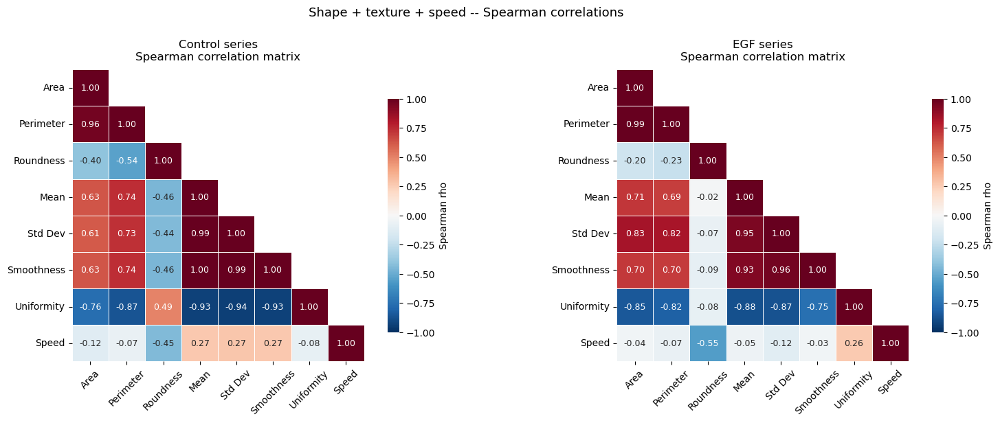

In [9]:

from scipy.stats import spearmanr
import seaborn as sns
import pandas as pd

RENAME = {
    'Area (px2)':          'Area',
    'Perim. (px)':         'Perimeter',
    'Roundness':           'Roundness',
    'Mean':                'Mean',
    'Std Dev':             'Std Dev',
    'Smoothness':          'Smoothness',
    'Uniformity':          'Uniformity',
    'Mean Speed (px/min)': 'Speed',
}
FEATURE_COLS = ['Area', 'Perimeter', 'Roundness',
                'Mean', 'Std Dev', 'Smoothness', 'Uniformity']

def make_combined_df(df_shape_tex, df_vel):
    df = df_shape_tex.drop(columns=['Frames'], errors='ignore').join(
         df_vel[['Mean Speed (px/min)']])
    df = df.rename(columns=RENAME)
    return df[FEATURE_COLS + ['Speed']].dropna()

df_ctrl_combined = make_combined_df(df_ctrl, df_vel_ctrl)
df_egf_combined  = make_combined_df(df_egf,  df_vel_egf)

corr_ctrl = df_ctrl_combined.corr(method='spearman')
corr_egf  = df_egf_combined.corr(method='spearman')


fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, corr, title in zip(axes,
                            [corr_ctrl, corr_egf],
                            ['Control series', 'EGF series']):
    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask, k=1)] = True
    sns.heatmap(corr, ax=ax, mask=mask, annot=True, fmt='.2f',
                cmap='RdBu_r', vmin=-1, vmax=1, linewidths=0.5,
                annot_kws={'size': 9}, square=True,
                cbar_kws={'shrink': 0.8, 'label': 'Spearman rho'})
    ax.set_title(f'{title}\nSpearman correlation matrix', fontsize=12, pad=10)
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)

plt.suptitle("Shape + texture + speed -- Spearman correlations", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(OUT_DIR / "corr_heatmap_full.png"), dpi=150, bbox_inches='tight')
plt.show()

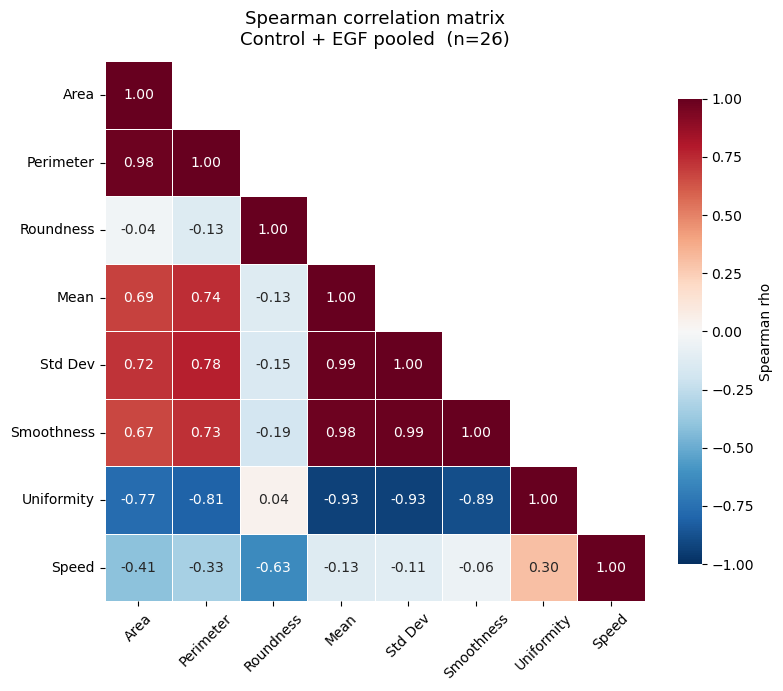

In [10]:
# Combined correlation heatmap - more informative
df_combined = pd.concat([df_ctrl_combined, df_egf_combined], ignore_index=True)
corr_combined = df_combined.corr(method='spearman')

fig, ax = plt.subplots(figsize=(8, 7))

mask = np.zeros_like(corr_combined, dtype=bool)
mask[np.triu_indices_from(mask, k=1)] = True

sns.heatmap(corr_combined, ax=ax, mask=mask, annot=True, fmt='.2f',
            cmap='RdBu_r', vmin=-1, vmax=1, linewidths=0.5,
            annot_kws={'size': 10}, square=True,
            cbar_kws={'shrink': 0.8, 'label': 'Spearman rho'})

ax.set_title('Spearman correlation matrix\nControl + EGF pooled  (n=26)',
             fontsize=13, pad=12)
ax.tick_params(axis='x', rotation=45)
ax.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.savefig(str(OUT_DIR / "corr_heatmap_combined.png"), dpi=150, bbox_inches='tight')
plt.show()